<a href="https://colab.research.google.com/github/dpwalford/DS/blob/main/Final_Project_Notebook_Hahn_Stats_24.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Final Project Notebook - Spring 2024

In [ ]:
import matplotlib.pyplot as plt
import imageio
import torch
import torchvision
from torchvision import models, transforms
import numpy as np
from torchvision.models import *
from PIL import Image
import requests
from torchvision import models
from torchsummary import summary

In [ ]:
def plot(x):
    fig, ax = plt.subplots()
    im = ax.imshow(x,cmap='gray')
    ax.axis('off')
    fig.set_size_inches(20, 20)
    plt.show()

In [ ]:
im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png')

<ipython-input-3-2086ec9e0cf6>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png')


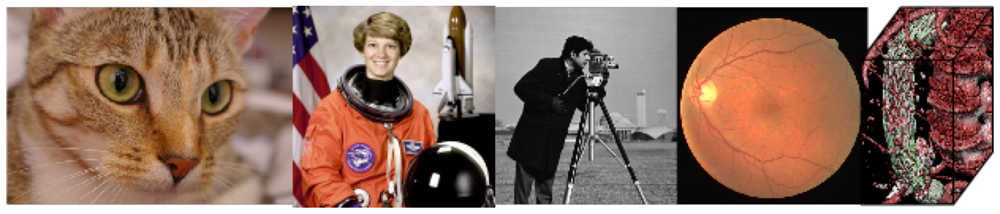

In [ ]:
plot(im)

In [ ]:
net = alexnet(pretrained=True).cuda(0)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 158MB/s]


In [ ]:
normalize = transforms.Normalize(
   mean=[0.485, 0.456, 0.406],
   std=[0.229, 0.224, 0.225]
)
preprocess = transforms.Compose([
   transforms.Resize(256),
   transforms.CenterCrop(224),
   transforms.ToTensor(),
   normalize
])

In [ ]:
im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg')

<ipython-input-7-772805ffc2cf>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg')


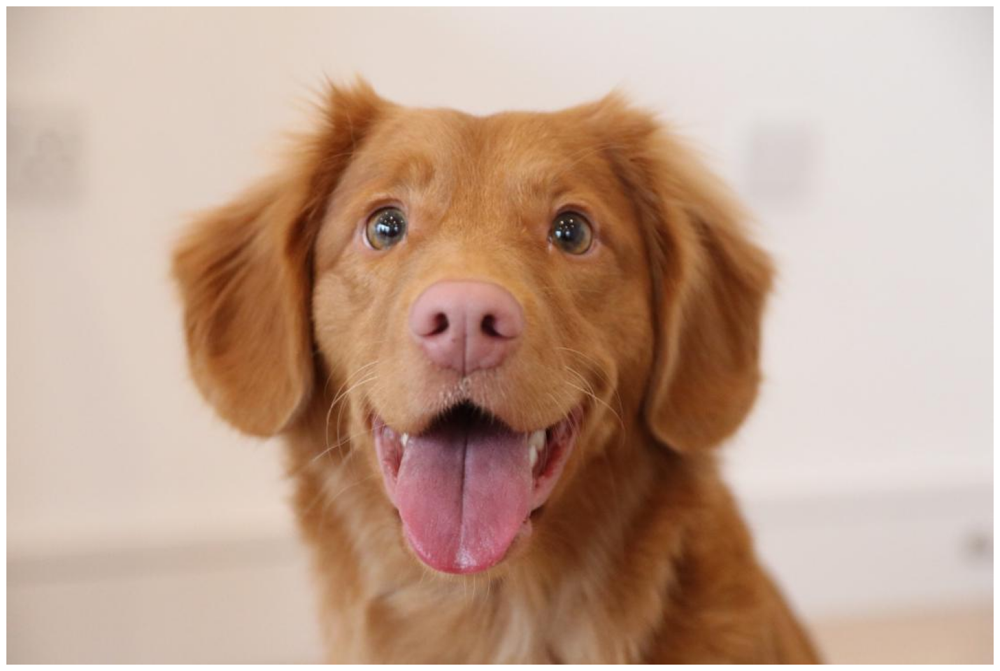

In [ ]:
plot(im)

In [ ]:
image = Image.fromarray(im) #convert to pil

In [ ]:
img_tensor = preprocess(image)

In [ ]:
img_tensor = img_tensor.unsqueeze_(0)

In [ ]:
img_tensor.shape

torch.Size([1, 3, 224, 224])

In [ ]:
img_variable = torch.tensor(img_tensor).cuda(0)

<ipython-input-13-a3c4eb55103d>:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


In [ ]:
out = net(img_variable)

In [ ]:
label_index = out.cpu().data.numpy().argmax()

In [ ]:
label_index

207

In [ ]:
top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:])

In [ ]:
LABELS_URL = 'https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json'

In [ ]:
labels = {int(key):value for (key, value) in requests.get(LABELS_URL).json().items()}

In [ ]:
print(labels[label_index])

golden retriever


In [ ]:
for i in range(10):
    print(labels[top_list[i]])

golden retriever
Brittany spaniel
Irish setter, red setter
Sussex spaniel
vizsla, Hungarian pointer
chow, chow chow
Labrador retriever
cocker spaniel, English cocker spaniel, cocker
clumber, clumber spaniel
tennis ball


In [ ]:
net

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [ ]:
summary(net, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 55, 55]          23,296
              ReLU-2           [-1, 64, 55, 55]               0
         MaxPool2d-3           [-1, 64, 27, 27]               0
            Conv2d-4          [-1, 192, 27, 27]         307,392
              ReLU-5          [-1, 192, 27, 27]               0
         MaxPool2d-6          [-1, 192, 13, 13]               0
            Conv2d-7          [-1, 384, 13, 13]         663,936
              ReLU-8          [-1, 384, 13, 13]               0
            Conv2d-9          [-1, 256, 13, 13]         884,992
             ReLU-10          [-1, 256, 13, 13]               0
           Conv2d-11          [-1, 256, 13, 13]         590,080
             ReLU-12          [-1, 256, 13, 13]               0
        MaxPool2d-13            [-1, 256, 6, 6]               0
AdaptiveAvgPool2d-14            [-1, 25

In [ ]:
out = net.features[0](img_variable).cpu().detach().numpy()

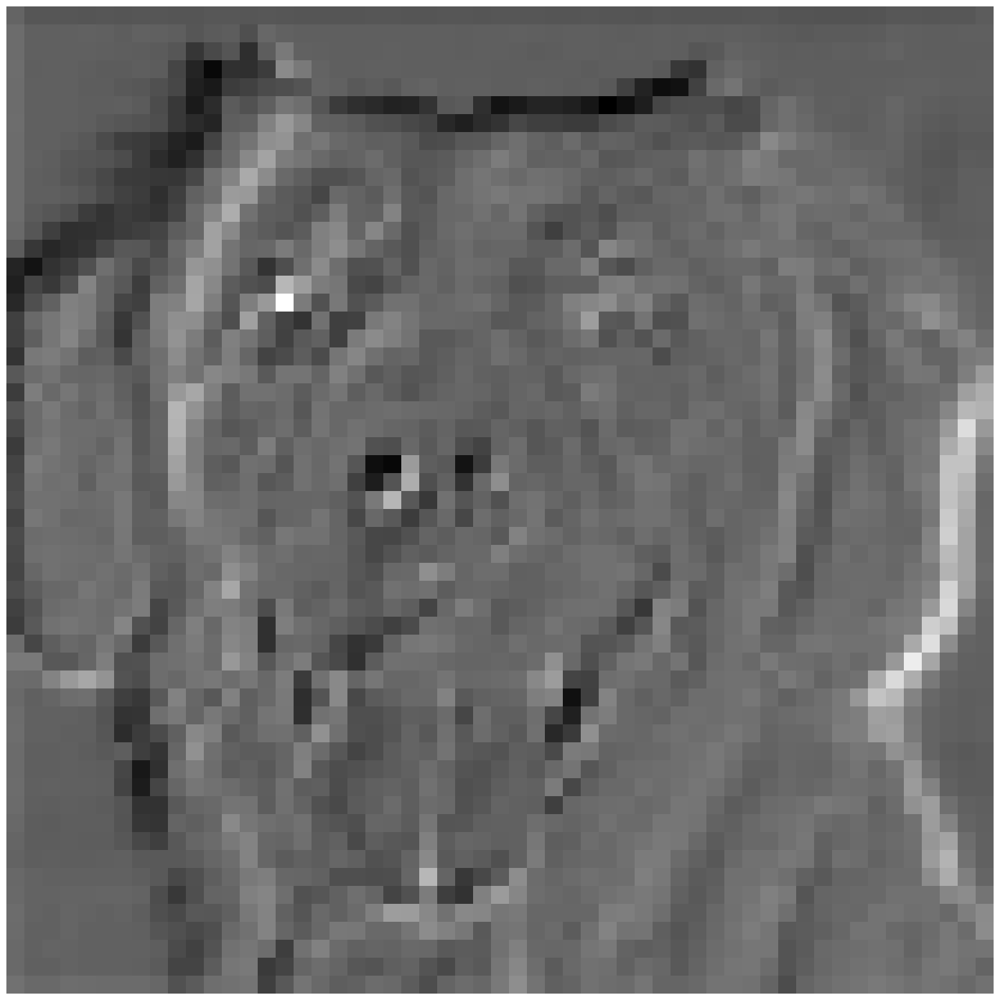

In [ ]:
plot(out[0,0,:,:])

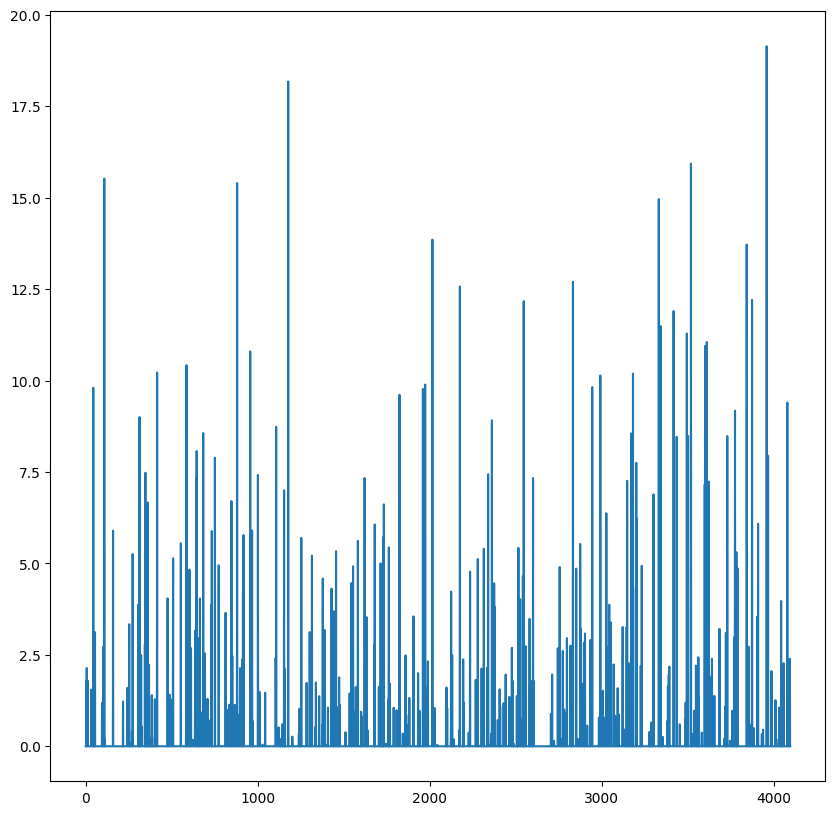

In [ ]:
plt.plot(np.arange(4096),net.classifier[0:6](net.avgpool(net.features[0:13](img_variable)).flatten()).cpu().detach().numpy())
fig = plt.gcf()
fig.set_size_inches(10, 10)

In [ ]:
im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')

<ipython-input-27-db4016f420a5>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')


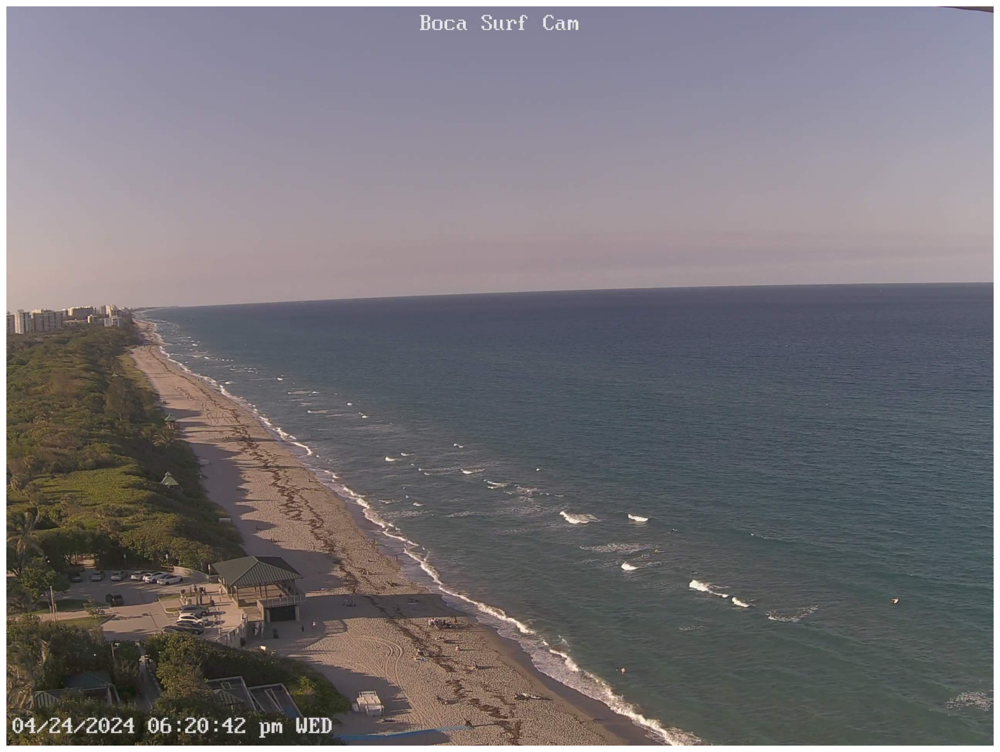

In [ ]:
plot(im)

In [ ]:
def load_im(im):
    image = Image.fromarray(im) #convert to pil
    img_tensor = preprocess(image)
    img_tensor = img_tensor.unsqueeze_(0)
    img_variable = torch.tensor(img_tensor).cuda(0)
    return img_variable

In [ ]:
out = net(load_im(im))

<ipython-input-30-4f8a3494e1c8>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


In [ ]:
def inference(im):
    out = net(load_im(im))
    label_index = out.cpu().data.numpy().argmax()
    top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:])
    print(labels[label_index])
    print('____')
    for i in range(10):
        print(labels[top_list[i]])

In [ ]:
inference(im)

promontory, headland, head, foreland
____
promontory, headland, head, foreland
volcano
cliff, drop, drop-off
sandbar, sand bar
seashore, coast, seacoast, sea-coast
valley, vale
breakwater, groin, groyne, mole, bulwark, seawall, jetty
beacon, lighthouse, beacon light, pharos
lakeside, lakeshore
stone wall


<ipython-input-30-4f8a3494e1c8>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


# Restart Notebook (Disconnect and Delete Runtime) Before Running Next Section

# Custom Data Deck

Installing and importing all necessary packages.

In [1]:
%%capture
!pip install wandb
!apt-get install poppler-utils
!pip install pdf2image
!pip install flashtorch
import requests
from pdf2image import convert_from_path
import matplotlib.pyplot as plt
import numpy as np
import torch
import requests
from torchvision import *
from torchvision.models import *
from flashtorch.utils import apply_transforms
import wandb as wb

Creating functions to utilize GPU

In [2]:
def GPU(data):
    return torch.tensor(data, requires_grad=True, dtype=torch.float, device=torch.device('cuda'))

def GPU_data(data):
    return torch.tensor(data, requires_grad=False, dtype=torch.float, device=torch.device('cuda'))

creates a plotting function

In [3]:
def plot(x):
    fig, ax = plt.subplots()
    im = ax.imshow(x, cmap = 'gray')
    ax.axis('off')
    fig.set_size_inches(5, 5)
    plt.show()

Functions to access google slides

In [4]:
def get_google_slide(url):
    url_head = "https://docs.google.com/presentation/d/"
    url_body = url.split('/')[5]
    page_id = url.split('.')[-1]
    return url_head + url_body + "/export/pdf?id=" + url_body + "&pageid=" + page_id

def get_slides(url):
    url = get_google_slide(url)
    r = requests.get(url, allow_redirects=True)
    open('file.pdf', 'wb').write(r.content)
    images = convert_from_path('file.pdf', 500)
    return images

def load(image):

    return apply_transforms(image).clone().detach().requires_grad_(True).to(device)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [5]:
labels = {int(key):value for (key, value) in requests.get('https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json').json().items()}

In [6]:
model = alexnet(weights='DEFAULT').to(device)
model.eval();

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:03<00:00, 61.1MB/s]


Loads my dataset of glasses vs no glasses

In [7]:
url = "https://docs.google.com/presentation/d/1oSd7LG-ac0X7oKcYP60eKfqrHo7iOdOKM249BtYyrDw/edit#slide=id.p"

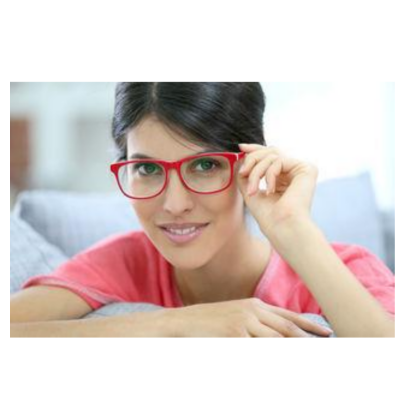

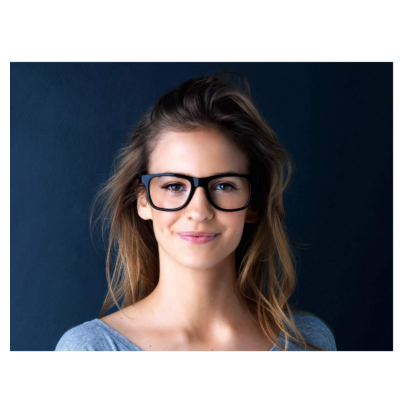

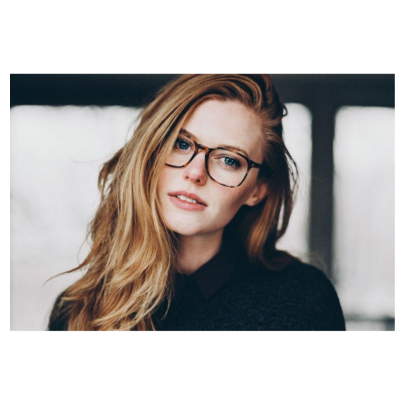

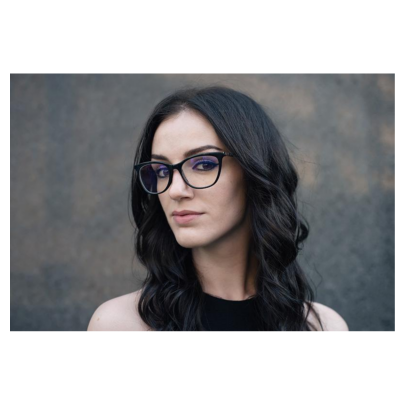

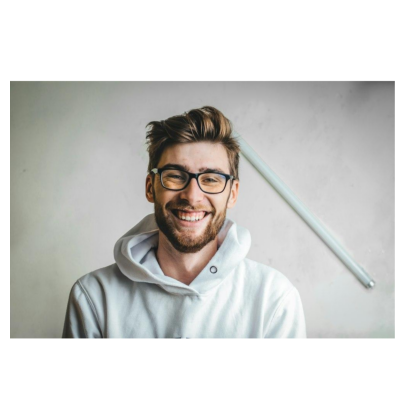

...

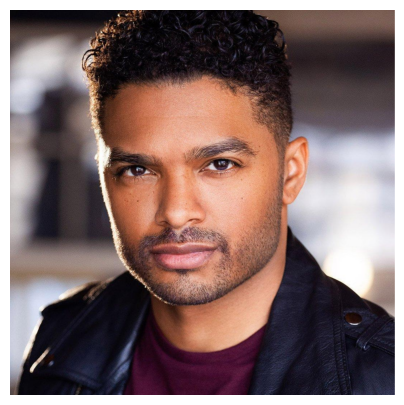

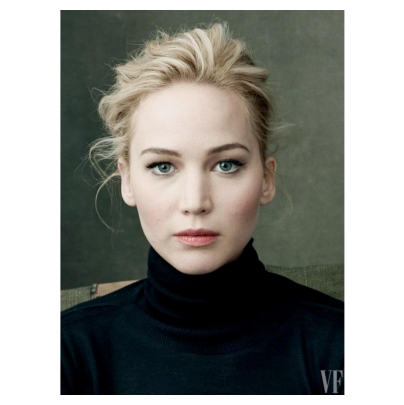

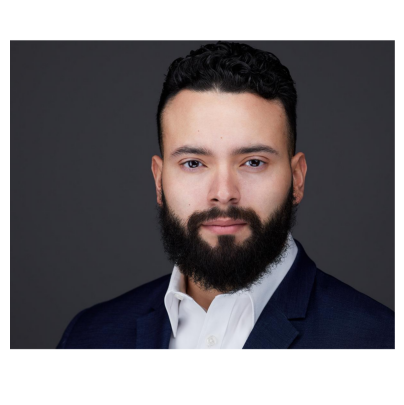

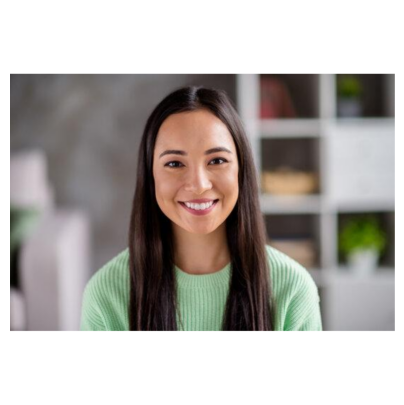

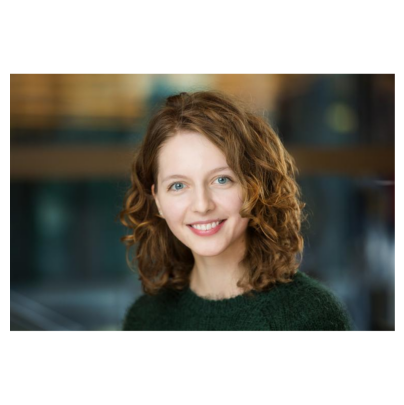

In [8]:
images = []

for image in get_slides(url):

    plot(image)

    images.append(load(image))

images = torch.vstack(images)

In [9]:
images.shape

torch.Size([50, 3, 224, 224])

In [10]:
model(images)

tensor([[-4.0410, -0.7207, -3.1051,  ..., -5.4743,  0.8080,  4.3100],
        [ 0.0610, -1.9994, -1.9961,  ..., -2.8625, -1.0642,  3.7680],
        [ 0.3474, -2.6225, -3.6890,  ..., -4.9869, -1.3464,  2.1135],
        ...,
        [ 3.0704, -0.6367, -3.0043,  ..., -3.4294,  0.3703,  4.5380],
        [ 1.5060, -3.1737, -3.3729,  ..., -2.9438,  0.6299,  4.2812],
        [ 1.3346, -4.3247, -2.9904,  ..., -2.3367,  1.3092,  1.5439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

In [11]:
y = model(images)

In [12]:
y.shape

torch.Size([50, 1000])

In [13]:
guesses = torch.argmax(y, 1).cpu().numpy()

Prints guess labels

In [14]:
for i in list(guesses):
    print(labels[i])

bikini, two-piece
brassiere, bra, bandeau
academic gown, academic robe, judge's robe
abaya
neck brace
mortarboard
notebook, notebook computer
academic gown, academic robe, judge's robe
flute, transverse flute
ping-pong ball
neck brace
neck brace
brassiere, bra, bandeau
mortarboard
lab coat, laboratory coat
academic gown, academic robe, judge's robe
face powder
bow tie, bow-tie, bowtie
notebook, notebook computer
bathtub, bathing tub, bath, tub
sunglass
neck brace
panpipe, pandean pipe, syrinx
car mirror
lab coat, laboratory coat
notebook, notebook computer
academic gown, academic robe, judge's robe
miniskirt, mini
car mirror
suit, suit of clothes
academic gown, academic robe, judge's robe
suit, suit of clothes
wig
suit, suit of clothes
brassiere, bra, bandeau
trench coat
drumstick
suit, suit of clothes
stole
bulletproof vest
wig
suit, suit of clothes
tench, Tinca tinca
lab coat, laboratory coat
lab coat, laboratory coat
suit, suit of clothes
wig
neck brace
web site, website, internet s

In [15]:
Y = np.zeros(50,)
Y[25:] = 1

In [16]:
Y

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [17]:
X = y.detach().cpu().numpy()

In [18]:
X.shape

(50, 1000)

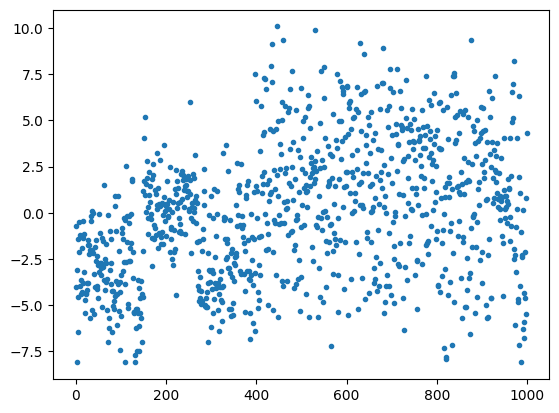

In [19]:
plt.plot(X[0],'.')

In [ ]:
X[0]

In [21]:
np.argmax(X[0])

445

In [22]:
labels[948]

'Granny Smith'

In [23]:
top_ten = np.argsort(X[0])[::-1][0:10]

In [24]:
for i in top_ten:
    print(labels[i])

bikini, two-piece
diaper, nappy, napkin
brassiere, bra, bandeau
tub, vat
lipstick, lip rouge
bathtub, bathing tub, bath, tub
notebook, notebook computer
maillot
bubble
bathing cap, swimming cap


In [ ]:
labels

(array([ 26.,  94., 143., 154., 189., 170., 107.,  68.,  41.,   8.]),
 array([-8.11276913, -6.29205084, -4.47133255, -2.65061426, -0.82989597,
         0.99082232,  2.8115406 ,  4.63225889,  6.45297718,  8.27369499,
        10.09441376]),
 <BarContainer object of 10 artists>)

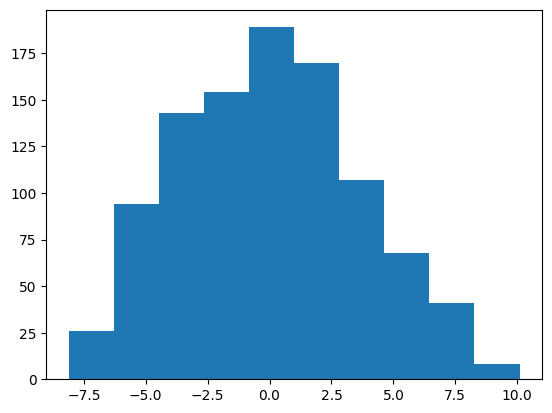

In [26]:
plt.hist(X[0])

In [27]:
X = GPU_data(X)
Y = GPU_data(Y)

The following functions explained:

**softmax(x):**

Applies the softmax function to an input tensor x, adjusting for numerical stability by subtracting the maximum value in each row before applying the exponential function.
Divides the exponentiated adjusted values by the sum of exponentiated adjusted values in each row, effectively normalizing them so that each row sums to 1.



**cross_entropy(outputs, labels):**

Calculates the cross-entropy loss between the model's predictions (outputs) and the true labels (labels).
It applies the softmax to the outputs, then uses the labels to select the corresponding predicted probabilities, and finally takes the log and sums up the negative values to get the loss.



**Truncated_Normal(size):**

Generates samples from a truncated normal distribution.
It uses two uniform random samples to transform them into a sample of a standard normal distribution via the inverse transform sampling method, followed by a cosine transformation.



**acc(out,y):**

Computes the accuracy of predictions.
It compares the model's predicted output (out) with the true labels (y) and calculates the proportion of correct predictions.



**get_batch(mode):**

Retrieves a batch of data for training or testing based on the mode specified ("train" or "test").
Randomly selects a subset of data points to create a batch and returns the features and labels for that batch.



**model1(x,w):**

Represents a simple linear model.
It multiplies an input tensor x with a weight matrix w to produce the output, typically used as logits before applying a softmax function.

In [28]:
def softmax(x):
    s1 = torch.exp(x - torch.max(x,1)[0][:,None])
    s = s1 / s1.sum(1)[:,None]
    return s

In [29]:
def cross_entropy(outputs, labels):
    return -torch.sum(softmax(outputs).log()[range(outputs.size()[0]), labels.long()])/outputs.size()[0]

In [30]:
def Truncated_Normal(size):

    u1 = torch.rand(size)*(1-np.exp(-2)) + np.exp(-2)
    u2 = torch.rand(size)
    z  = torch.sqrt(-2*torch.log(u1)) * torch.cos(2*np.pi*u2)

    return z

In [31]:
def acc(out,y):
    with torch.no_grad():
        return (torch.sum(torch.max(out,1)[1] == y).item())/y.shape[0]

In [32]:
X.shape

torch.Size([50, 1000])

In [33]:
def get_batch(mode):
    b = c.b
    if mode == "train":
        r = np.random.randint(X.shape[0]-b)
        x = X[r:r+b,:]
        y = Y[r:r+b]
    elif mode == "test":
        r = np.random.randint(X_test.shape[0]-b)
        x = X_test[r:r+b,:]
        y = Y_test[r:r+b]
    return x,y

In [2]:
def model(x,w):

    return x@w[0]

In [3]:
def make_plots():

    acc_train = acc(model(x,w),y)

    wb.log({"acc_train": acc_train})

In [ ]:
wb.init(project="Linear_Model_Photo_1");
c = wb.config

c.h = 0.001
c.b = 4
c.epochs = 100000

w = [GPU(Truncated_Normal((1000,2)))]

optimizer = torch.optim.Adam(w, lr=c.h)

for i in range(c.epochs):

    x,y = get_batch('train')

    loss = cross_entropy(softmax(model(x,w)),y)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    wb.log({"loss": loss})

    make_plots()


Dr. Hahn,

Hope all is well! I had trouble getting this code to work, espically the weights and bias graph. I still added my datadeck and commented through it, I just couldn't get the weights and bias to work.

I still keep up my website from the class last spring and have both those alexnet projects linked there if you want to review them as well. Have a great summer and though our class time was limited this semester I wanted to thank you for another great semester and being a great professor.

My website:
danielwalford.com